# Explore the dataset


In this notebook, we will perform an EDA (Exploratory Data Analysis) on the processed Waymo dataset (data in the `processed` folder). In the first part, you will create a function to display 

In [1]:
from utils import get_dataset
from matplotlib import pyplot as plt
import tensorflow as tf
import numpy as np
import pandas as pd
import glob
import multiprocessing

%matplotlib inline

2022-11-06 22:57:09.883158: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0


In [2]:
folder = "./data/processed/"
extensions = "*.tfrecord"
dataset = get_dataset(folder+extensions)

INFO:tensorflow:Reading unweighted datasets: ['./data/processed/*.tfrecord']
INFO:tensorflow:Reading record datasets for input file: ['./data/processed/*.tfrecord']
INFO:tensorflow:Number of filenames to read: 100
Instructions for updating:
Use `tf.data.Dataset.interleave(map_func, cycle_length, block_length, num_parallel_calls=tf.data.AUTOTUNE)` instead. If sloppy execution is desired, use `tf.data.Options.experimental_deterministic`.
Instructions for updating:
Use `tf.data.Dataset.map()


2022-11-06 22:57:12.647250: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2022-11-06 22:57:12.795269: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:923] could not open file to read NUMA node: /sys/bus/pci/devices/0000:08:00.0/numa_node
Your kernel may have been built without NUMA support.
2022-11-06 22:57:12.795303: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:08:00.0 name: NVIDIA GeForce RTX 3070 computeCapability: 8.6
coreClock: 1.77GHz coreCount: 46 deviceMemorySize: 8.00GiB deviceMemoryBandwidth: 417.29GiB/s
2022-11-06 22:57:12.795324: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-11-06 22:57:12.886660: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2022-11-06 22:57:12.886721: I tensorflow/stream_executor

## Write a function to display an image and the bounding boxes

Implement the `display_instances` function below. This function takes a batch as an input and display an image with its corresponding bounding boxes. The only requirement is that the classes should be color coded (eg, vehicles in red, pedestrians in blue, cyclist in green).

In [3]:
def display_instances(batch):
    """
    This function takes a batch from the dataset and display the image with 
    the associated bounding boxes.
    """
    for elem in batch:
            pil_img = tf.keras.preprocessing.image.array_to_img(elem['image'])
            
            image = tf.expand_dims(tf.cast(elem['image'], tf.float32),axis=0)
            
            colors = []
            
            for gtc in elem['groundtruth_classes']:
                if gtc == 1: # Vehicle
                    colors.append([255.0,0,0])
                if gtc == 2: # Pedestrian
                    colors.append([0,255.0,0])
                if gtc == 4: # Cyclist
                    colors.append([0,0,255.0])
            
            
            plt.figure(figsize=[10,10])
            plt.imshow(pil_img)
            plt.axis('off')
            n_boxes = len(elem['groundtruth_boxes'])
            if n_boxes:
                boxes = np.array(elem['groundtruth_boxes']).reshape([1,n_boxes,4])
                boundbox = tf.image.draw_bounding_boxes(image,boxes,colors)
                pil_box = tf.keras.preprocessing.image.array_to_img(tf.squeeze(boundbox))
                plt.imshow(pil_box)

## Display 10 images 

Using the dataset created in the second cell and the function you just coded, display 10 random images with the associated bounding boxes. You can use the methods `take` and `shuffle` on the dataset.

2022-11-06 22:57:14.003086: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:176] None of the MLIR Optimization Passes are enabled (registered 2)
2022-11-06 22:57:14.005499: I tensorflow/core/platform/profile_utils/cpu_utils.cc:114] CPU Frequency: 3699995000 Hz


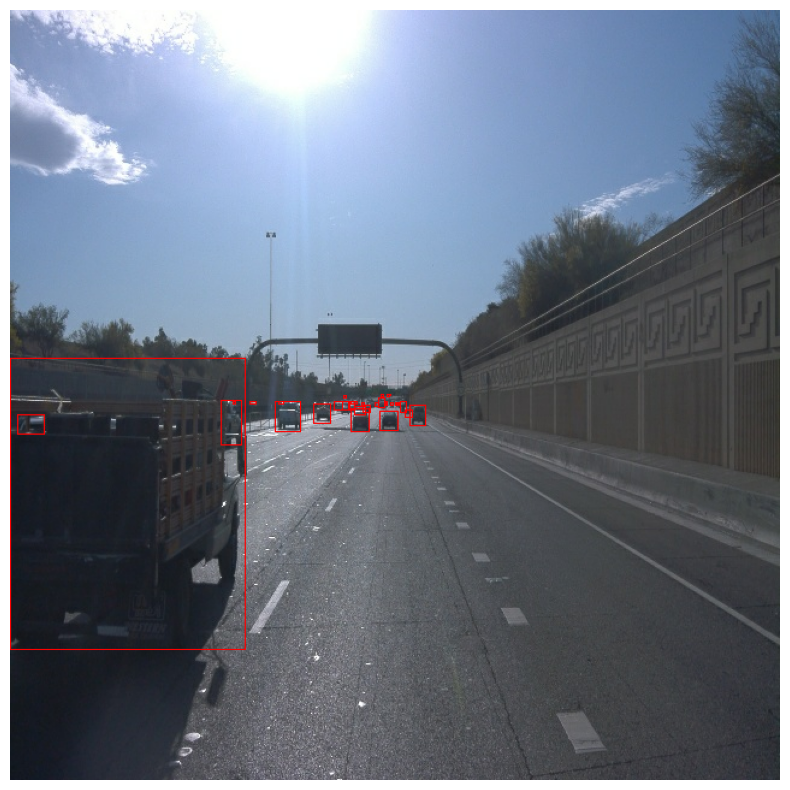

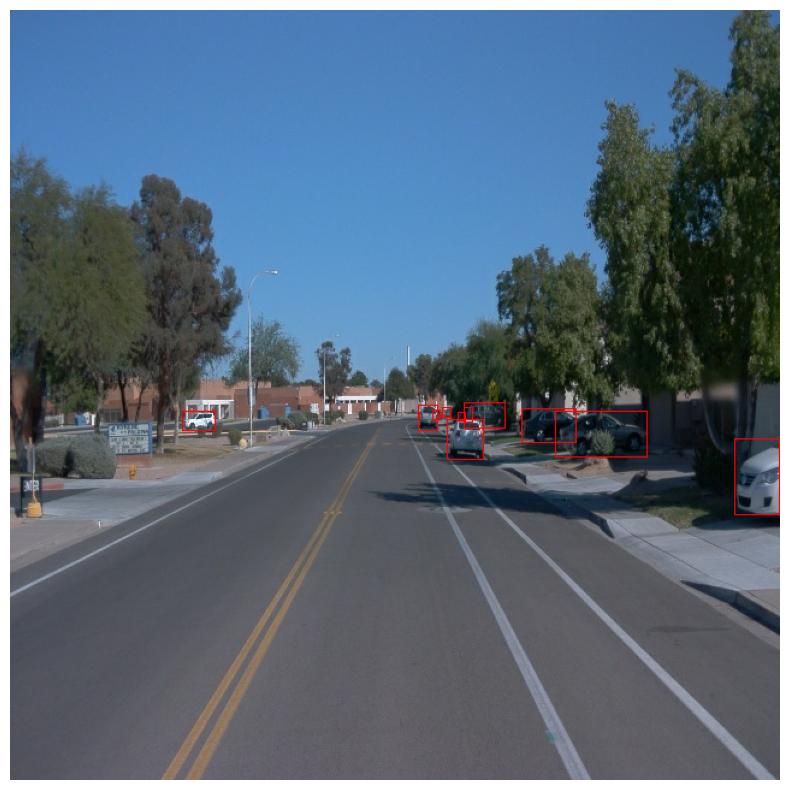

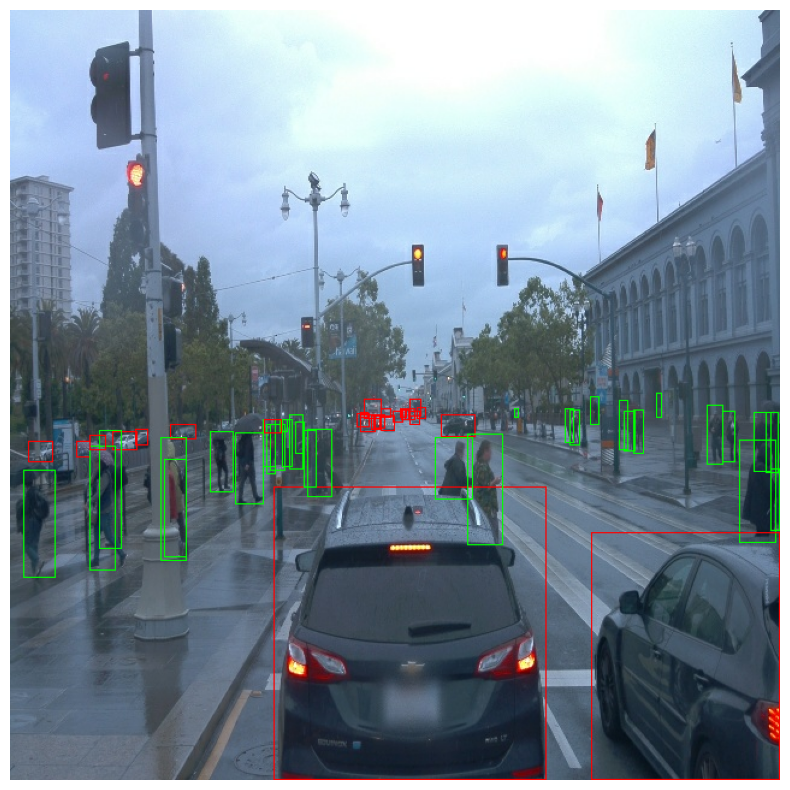

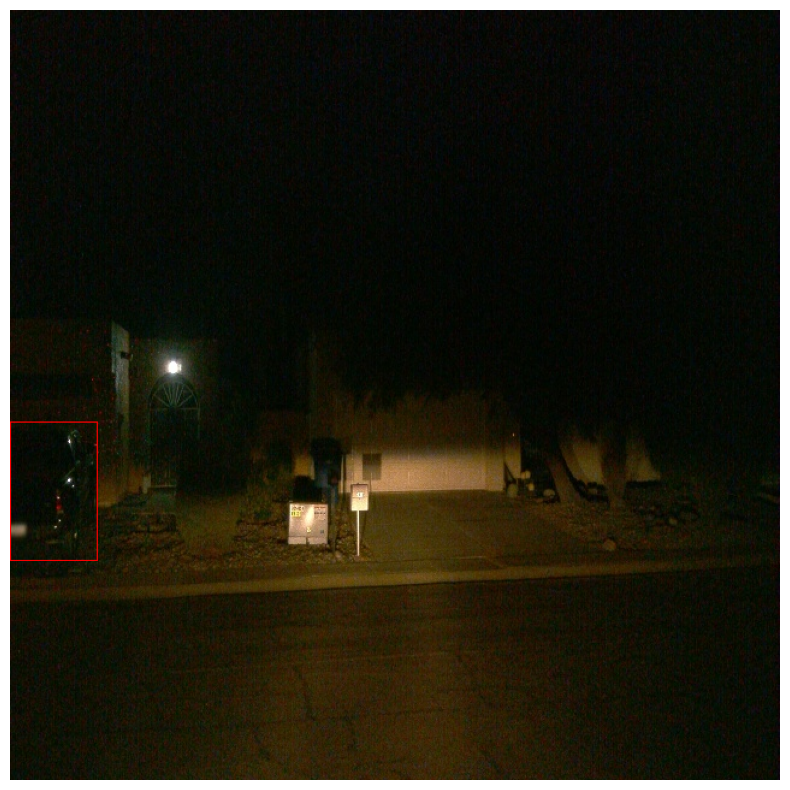

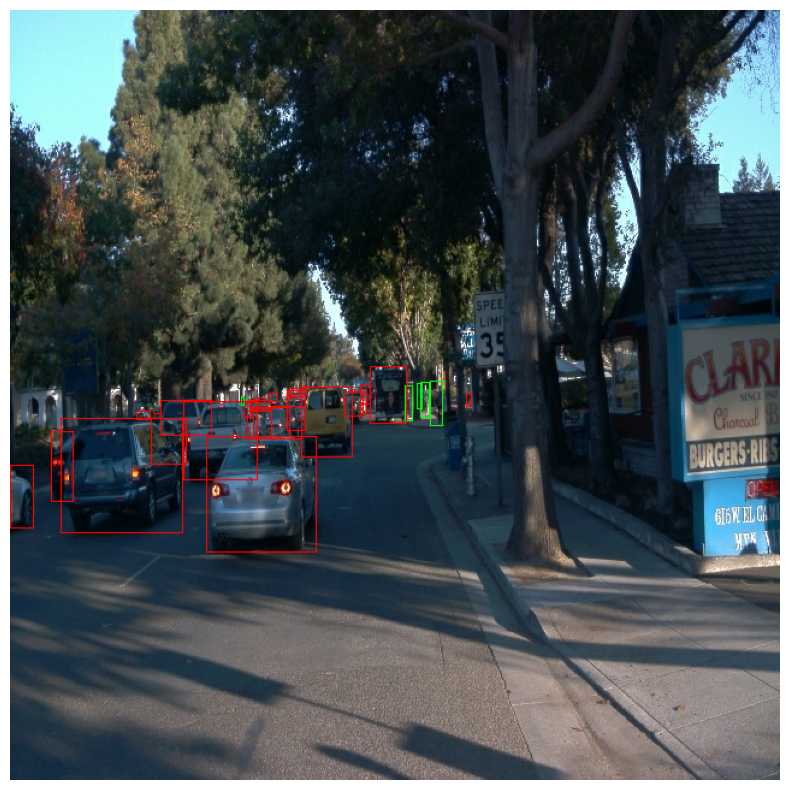

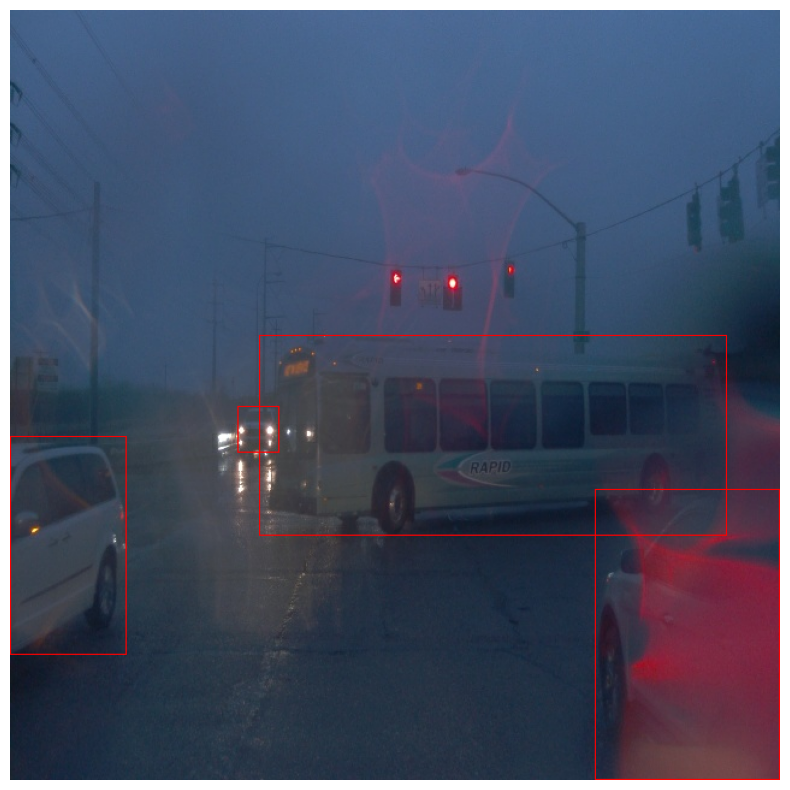

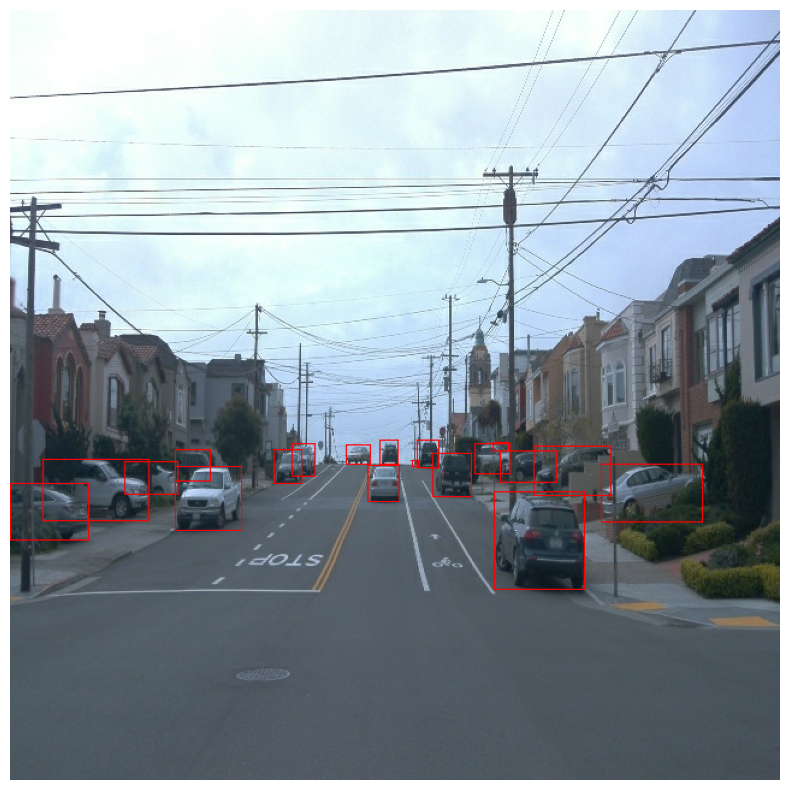

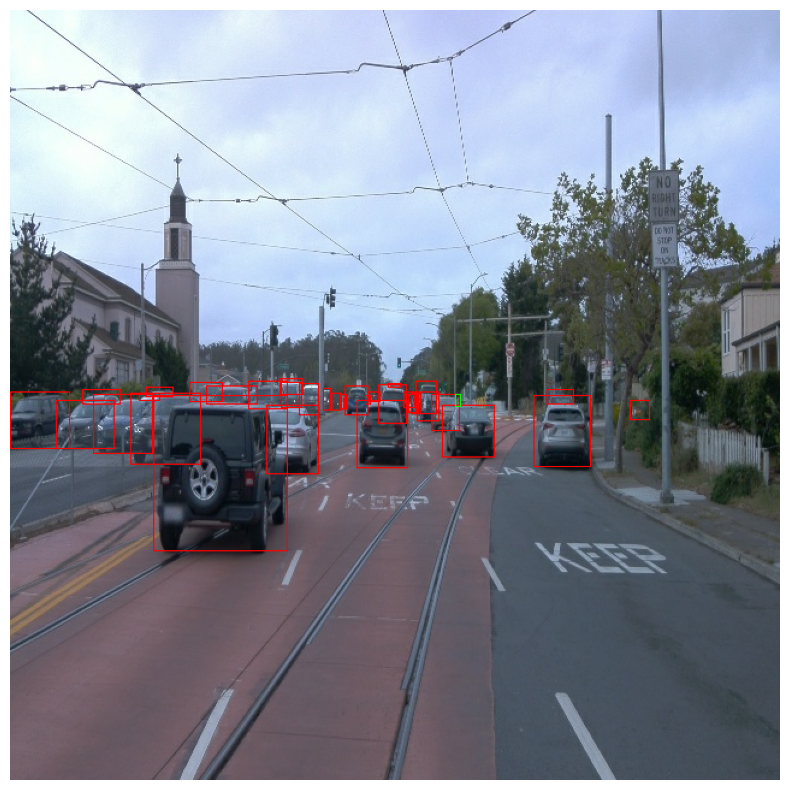

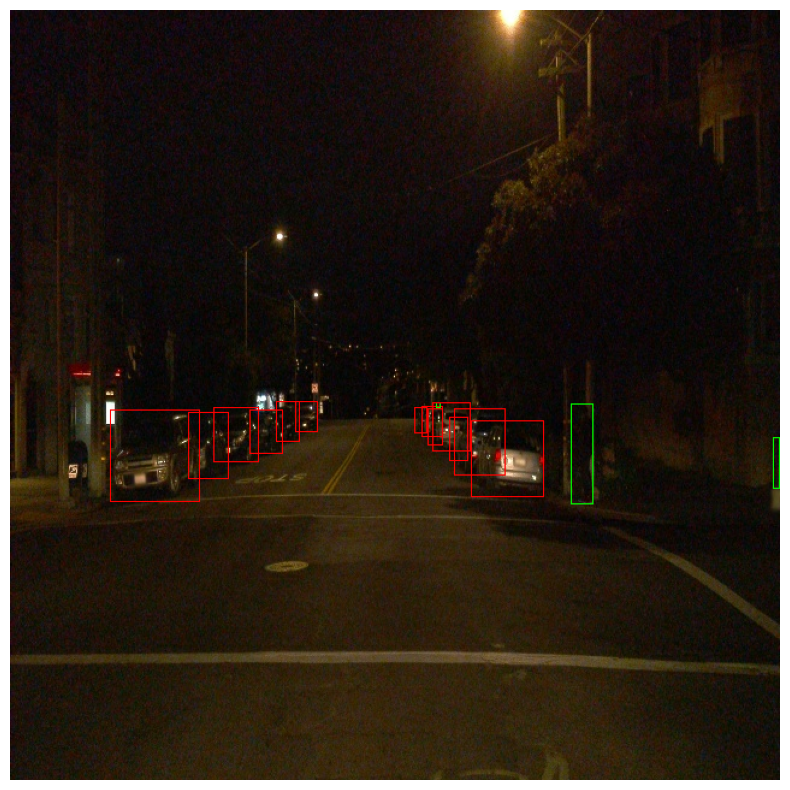

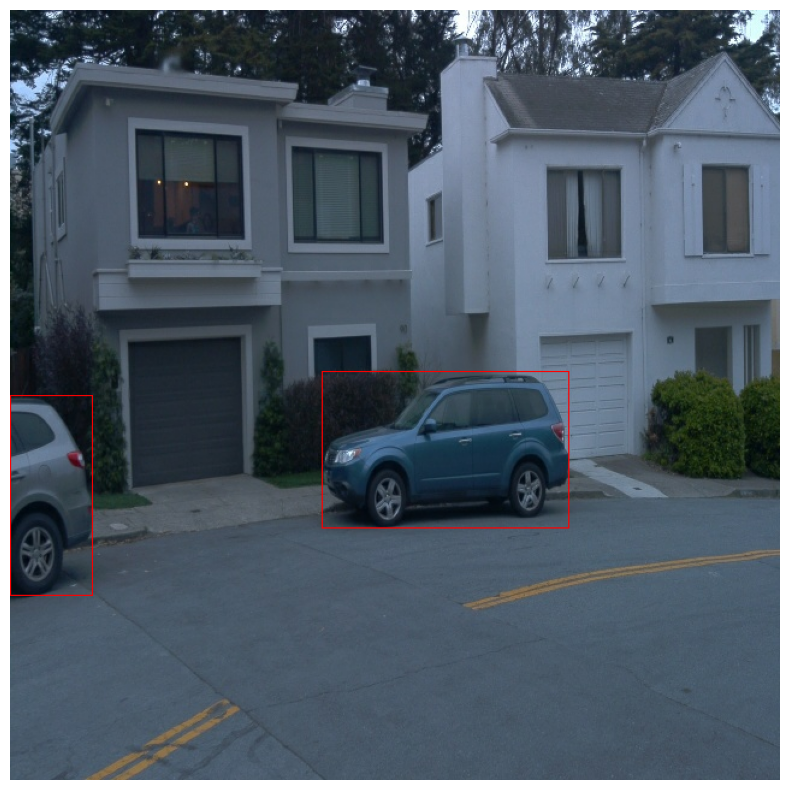

In [4]:
display_instances(dataset.shuffle(100).take(10))

## Additional EDA



If looping through the entire dataset takes forever, let's instead take a random sample of 1000 to better understand the data.

In [15]:
# This takes forever, so run with caution!
def extract_info(elem):
    #image = tf.cast(elem['image'], tf.float32)/255.0
    # Count classes and images
    #vehicle = list(elem['groundtruth_classes']).count(1)
    #pedestrian = pedestrian + list(elem['groundtruth_classes']).count(2)
    #cyclist = list(elem['groundtruth_classes']).count(4)
    # Get the mean pixel value of the image
    #m = tf.math.reduce_mean(image, axis=[0,1])
    # Get the standard deviation pixel value of the image
    #s = tf.math.reduce_std(image, axis=[0,1])
    #print(elem['groundtruth_classes'])
    return (elem['groundtruth_classes'], elem['filename'],
           tf.math.reduce_mean(
               tf.cast(elem['image'], 
               tf.float32)/255.0, axis=[0,1]), 
           tf.math.reduce_std(
               tf.cast(elem['image'], 
               tf.float32)/255.0, axis=[0,1])
           )
#vehicle, pedestrian, cyclist#, n_images, m, s
subset = dataset.shuffle(10000).take(1000)
subset = subset.map(extract_info)
results = list(per.as_numpy_iterator())
#per.map(lambda z:image_counts(z),num_parallel_calls=4)

In [17]:
vehicle = 0
pedestrian = 0
cyclist = 0
n_images = 0
means = []
stds = []
for elem in results:
    # Count classes and images
    vehicle = vehicle + list(elem[0]).count(1)
    pedestrian = pedestrian + list(elem[0]).count(2)
    cyclist = cyclist + list(elem[0]).count(4)
    n_images+=1
    # Get the mean pixel value of the image
    means.append(elem[2])
    # Get the standard deviation pixel value of the image
    stds.append(elem[3])

In [18]:
print(f"Total number of images: {n_images}")
print(f"Vehicles: {vehicle}, Pedestrians: {pedestrian}, Cyclist: {cyclist}")

Total number of images: 1000
Vehicles: 17669, Pedestrians: 5365, Cyclist: 126


A very uneven class distribution indeed!

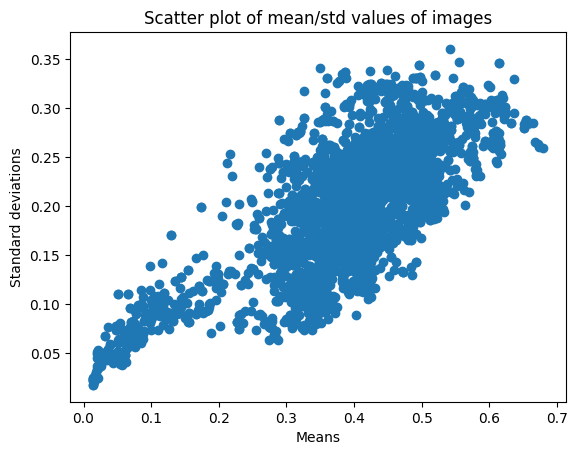

In [20]:
plt.scatter(means,stds)
plt.title('Scatter plot of mean/std values of images')
plt.xlabel('Means')
plt.ylabel('Standard deviations');

There's a high difference in pixel values for daylight/night time, but also different lightning settings.